# Notebook to display possible offending images pre-selected by our proposed method and CLIP

Before running, download the repository and the datasets ImageNet1k (optional: ImageNet21k). Adapt paths if necessary.

In [1]:
repo_path = '/workspace/repositories/OffImgDetectionCLIP'
dataset_path = '/workspace/datasets'

In [2]:
import sys
sys.path.append(repo_path)

In [3]:
import numpy as np
import os
from IPython.display import Image
import glob
from main.experiments import find_images

PyTorch Version:  1.7.1+cu110
Torchvision Version:  0.8.2+cu110


In [4]:
image_paths = os.path.join(dataset_path, 'imagenet1k/val')
image_paths = find_images(image_paths)
print('Images:', len(image_paths))
imagenet_path_dict = dict()
for image_path in image_paths:
    imagenet_path_dict[os.path.basename(image_path).split('.')[0]] = image_path

Images: 50000


In [5]:
image_paths = os.path.join(dataset_path, 'imagenet1k/train')
image_paths = find_images(image_paths)
print('Images:', len(image_paths))
imagenet_path_dict_train = dict()
for image_path in image_paths:
    imagenet_path_dict_train[os.path.basename(image_path).split('.')[0]] = image_path

Images: 1281167


In [6]:
image_paths_dir = os.path.join(dataset_path, 'imagenet21k/imagenet21k_resized/imagenet21k_val')
image_paths = find_images(image_paths_dir)
image_paths_dir = os.path.join(dataset_path, 'imagenet21k/imagenet21k_resized/imagenet21k_train')
image_paths += find_images(image_paths_dir)
image_paths_dir = os.path.join(dataset_path, 'imagenet21k/imagenet21k_resized/imagenet21k_small_classes')
image_paths += find_images(image_paths_dir)
print('Images:', len(image_paths))
imagenet_path_dict_21kval = dict()
for image_path in image_paths:
    imagenet_path_dict_21kval[os.path.basename(image_path).split('.')[0]] = image_path

Images: 13153480


In [7]:
def readoffendingimages_csv(data_path, t=1.00):
    data = list(np.loadtxt(open(data_path, "rb"), delimiter=",", skiprows=1, dtype=str))
    data = sorted(data, key=lambda d: -float(d[2]))
    files_ = [e[3].split('.')[0] for e in data if float(e[2]) >= t]
    
    return files_

### Switch between different datasets

In [8]:
#csv_tag = 'imagenet21k_small_classes'
#csv_tag = 'imagenet21k_train'
#csv_tag = 'imagenet21k_val'
csv_tag = 'imagenet1k_train'
#csv_tag = 'imagenet1k_val'

data_type = 'moral'

dir_path_csv = os.path.join(repo_path, f'results/ViT-B-16/{csv_tag}/off_images.csv')
prompt_path = os.path.join(repo_path, f'results/ViT-B-16/prompts.p')

files = readoffendingimages_csv(dir_path_csv,t=.8)

In [9]:
import PIL
import matplotlib.pyplot as plt

if csv_tag == 'imagenet1k_train':
    images = [imagenet_path_dict_train[file_] for file_ in files]
    print('#Images found offending', len(images))
elif 'imagenet21k' in csv_tag:
    images = [imagenet_path_dict_21kval[file_] for file_ in files]
    print('#Images found offending', len(images))
else:
    images = [imagenet_path_dict[file_] for file_ in files]
    print('#Images found offending', len(images))
    

def show_images_by_idx(idx):
    img = PIL.Image.open(images[idx])
    img = img.convert("RGB")
    img = img.resize((256,256), PIL.Image.ANTIALIAS)
    img = np.asarray(img)
    plt.imshow(np.asarray(img))
    ax = plt.gca()
    ax.axis('off')
    plt.show()
    plt.close()
    

def show_images_by_img(img):
    img = PIL.Image.open(img)
    img = img.convert("RGB")
    img = img.resize((256,256), PIL.Image.ANTIALIAS)
    img = np.asarray(img)
    plt.imshow(np.asarray(img))
    ax = plt.gca()
    ax.axis('off')
    plt.show()
    plt.close()
    

#Images found offending 39830


In [10]:
imagenet_dir_class = dict()

if "21k" in csv_tag:
    with open(os.path.join(dataset_path, "imagenet21k/imagenet21k_wordnet_lemmas.txt"), "r") as file_classes:
        with open(os.path.join(dataset_path, "imagenet21k/imagenet21k_wordnet_ids.txt"), "r") as file_dirs:
            for x in file_dirs:
                imgnet_dir = x.replace('\n', '')
                imgnet_class = file_classes.readline()
                imagenet_dir_class[imgnet_dir] = imgnet_class.replace('\n', '').split(',')[0]
else:
    import scipy.io
    mat = scipy.io.loadmat(os.path.join(dataset_path, "imagenet1k/meta.mat"))
    tmp = [(e[0][1], e[0][2]) for e in mat["synsets"]]
    for t in tmp:
        imagenet_dir_class[t[0].item()] = t[1].item().split(',')[0]

In [11]:
import matplotlib.pyplot as plt
import PIL
from tqdm import tqdm
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import ImageFilter
import os

selected_images_indices = list(range(len(images)))

found_images_by_wordnet_id = dict()
for im_idx in selected_images_indices:
    imgnet_dirname = os.path.basename(os.path.dirname(images[im_idx]))
    if imgnet_dirname in list(found_images_by_wordnet_id.keys()):
        found_images_by_wordnet_id[imgnet_dirname]['value'] += 1
        found_images_by_wordnet_id[imgnet_dirname]['idx'].append(im_idx)
    else:
        found_images_by_wordnet_id[imgnet_dirname] = {'value': 1, 'idx': list([im_idx])}

In [12]:
found_images_by_wordnet_id_classnames = dict()
for imageclass_id in list(found_images_by_wordnet_id.keys()):
    #print(imagenet_dir_class[imageclass_id], found_images_by_wordnet_id[imageclass_id])
    found_images_by_wordnet_id_classnames[imagenet_dir_class[imageclass_id]] = {'value': None, 'idx': None}
    found_images_by_wordnet_id_classnames[imagenet_dir_class[imageclass_id]]['value'] = found_images_by_wordnet_id[imageclass_id]['value']
    found_images_by_wordnet_id_classnames[imagenet_dir_class[imageclass_id]]['idx'] = found_images_by_wordnet_id[imageclass_id]['idx']

In [13]:
print(found_images_by_wordnet_id_classnames['squirrel monkey'])

{'value': 1, 'idx': [2302]}


39830
total classes with possible polluted images: 915
hammerhead
Angora
mailbox
guinea pig
rock python
barber chair
pill bottle
water tower
Komodo dragon
bluetick
trombone
stethoscope
grey fox
swimming trunks
stove
mitten
wolf spider
carpenter's kit
teapot
earthstar
Crock Pot
tow truck
backpack
sea lion
mask
komondor
paddle
harmonica
airship
tusker
padlock
vase
window screen
forklift
Christmas stocking
golf ball
jellyfish
apiary
tiger cat
night snake
doormat
manhole cover
wok
wood rabbit
bolete
Chesapeake Bay retriever
milk can
crash helmet
balloon
ladle
running shoe
mashed potato
coral fungus
shower cap
abacus
Dutch oven
racket
revolver
water bottle
pot
chocolate sauce
loupe
lighter
chain mail
torch
Mexican hairless
cash machine
beaver
ground beetle
shoe shop
puffer
sleeping bag
rock crab
park bench
seat belt
lens cap
plane
iron
syringe
birdhouse
caldron
patas
mousetrap
dung beetle
sombrero
wombat
unicycle
armadillo
envelope
tractor
pole
warplane
clog
vacuum
saltshaker
feather boa
di

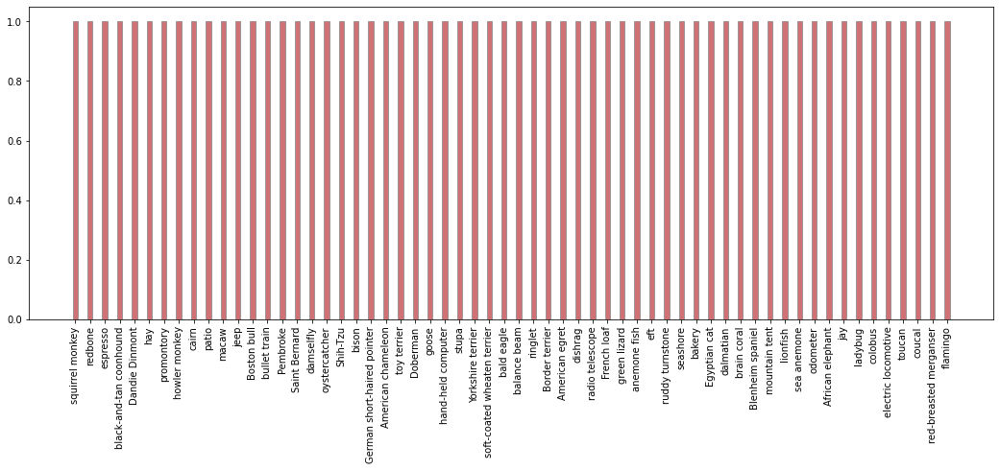

In [14]:
import seaborn as sns
print(len(images))
print('total classes with possible polluted images:',len(list(found_images_by_wordnet_id.keys())))
found_images_by_wordnet_id_list = list()
for imageclass_id in list(found_images_by_wordnet_id.keys()):
    #print(imagenet_dir_class[imageclass_id], found_images_by_wordnet_id[imageclass_id])
    print(imagenet_dir_class[imageclass_id])
    found_images_by_wordnet_id_list.append((imagenet_dir_class[imageclass_id], found_images_by_wordnet_id[imageclass_id]))
found_images_by_wordnet_id_list.sort(key=lambda tup: tup[1]['value'])

plt_list = found_images_by_wordnet_id_list[:60]
print(plt_list)
bars = [e[0] for e in plt_list]
y_pos = [e[1]['value'] for e in plt_list]
plt.figure(figsize=(18,6))
bar_color = sns.color_palette('deep')[3]
bar_color_edge = sns.color_palette('deep')[-3]
plt.bar(bars, 
        y_pos, width=0.35,
        alpha=0.8, color=bar_color, edgecolor=bar_color_edge, linewidth=1.)
ticks = np.arange(len(plt_list), dtype=float)
ticks -= 0.5
plt.xticks(rotation=90)
plt.show()
plt.close()

### display possible offending images of a given class. See class ids above for the possible classes

In [15]:
selected_images = []

# images from listing in section  4

## training set

### possible offending objects and animals

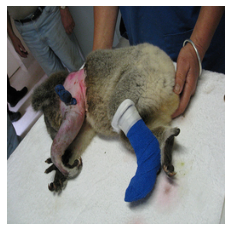

In [16]:
class_id = 'koala'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)

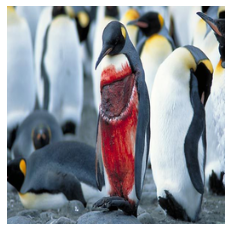

In [17]:
class_id = 'king penguin'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][1]
selected_images.append(images[img])
show_images_by_idx(img)

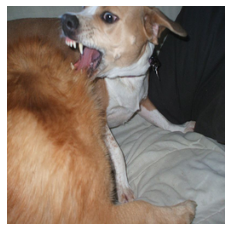

In [18]:
class_id = 'Pembroke'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)

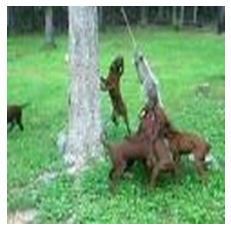

In [19]:
class_id = 'redbone'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)

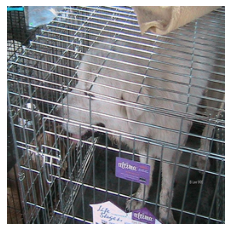

In [20]:
class_id = 'Great Pyrenees'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)

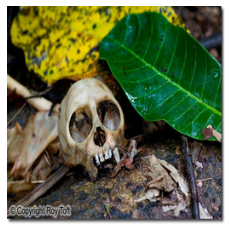

In [21]:
class_id = 'squirrel monkey'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)

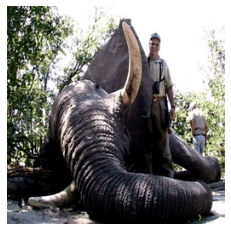

In [22]:
class_id = 'African elephant'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

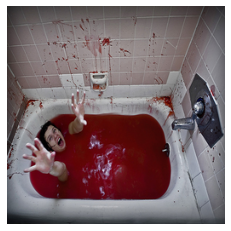

In [23]:
class_id = 'tub'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

### Possible Offending Symbols

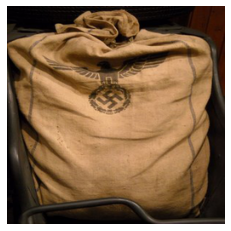

In [24]:
class_id = 'mailbag'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][1]
selected_images.append(images[img])
show_images_by_idx(img)

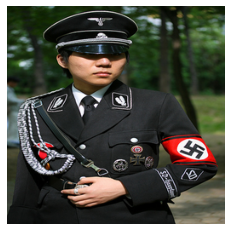

In [25]:
class_id = 'military uniform'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][2]
selected_images.append(images[img])
show_images_by_idx(img)

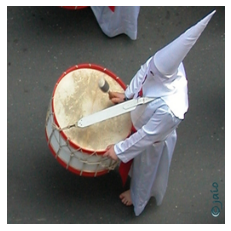

In [26]:
class_id = 'drum'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][4]
selected_images.append(images[img])
show_images_by_idx(img)

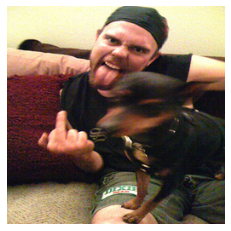

In [27]:
class_id = 'miniature pinscher'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

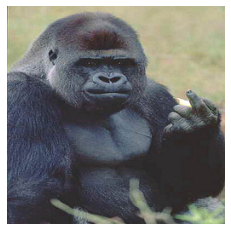

In [28]:
class_id = 'gorilla'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

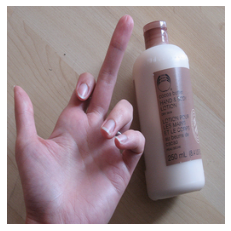

In [29]:
class_id = 'lotion'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][5]
show_images_by_idx(img)

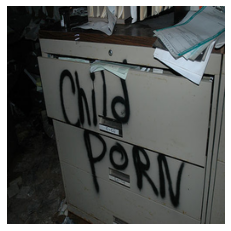

In [30]:
class_id = 'file'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

### Possible Offending Actions

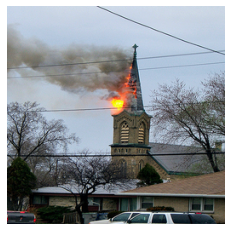

In [31]:
class_id = 'church'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

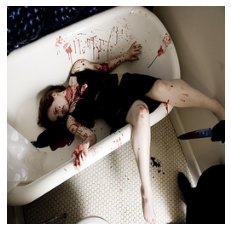

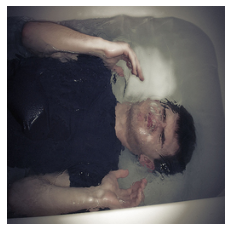

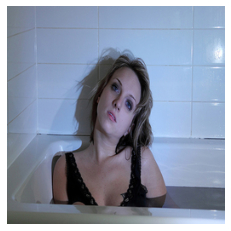

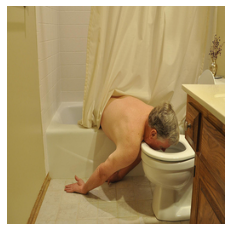

In [32]:
class_id = 'tub'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][5]
show_images_by_idx(img)
selected_images.append(images[img])
img = found_images_by_wordnet_id_classnames[class_id]['idx'][18]
show_images_by_idx(img)
img = found_images_by_wordnet_id_classnames[class_id]['idx'][78]
show_images_by_idx(img)
img = found_images_by_wordnet_id_classnames[class_id]['idx'][105]
selected_images.append(images[img])
show_images_by_idx(img)

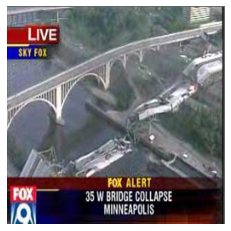

In [33]:
class_id = 'steel arch bridge'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)

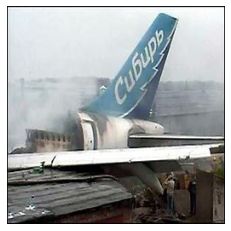

In [34]:
class_id = 'airliner'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)

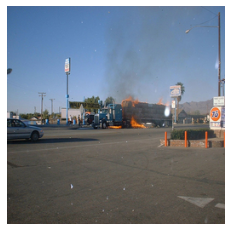

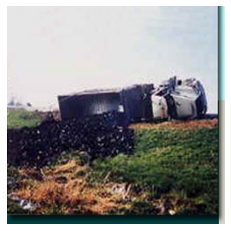

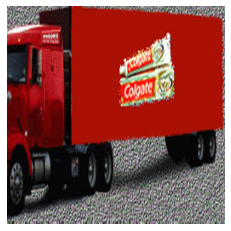

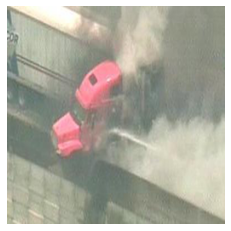

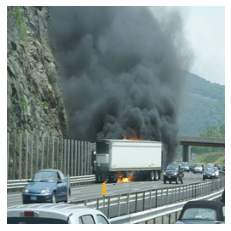

...

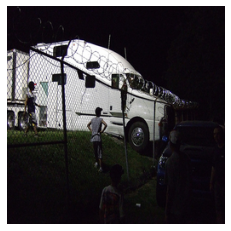

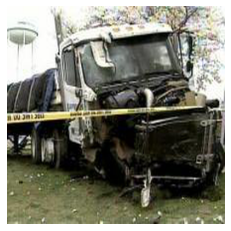

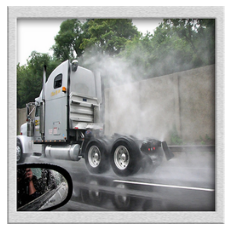

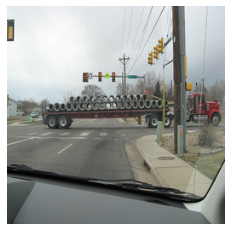

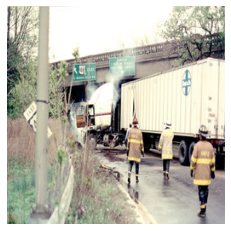

In [35]:
class_id = 'trailer truck'
for idx, i in enumerate(found_images_by_wordnet_id_classnames[class_id]['idx']):
    show_images_by_idx(i)

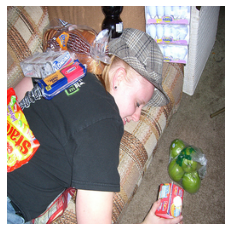

In [36]:
class_id = 'Granny Smith'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][3]
selected_images.append(images[img])
show_images_by_idx(img)

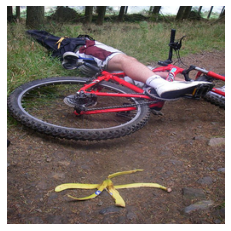

In [37]:
class_id = 'mountain bike'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][4]
show_images_by_idx(img)

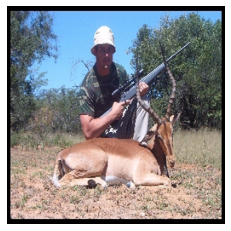

In [38]:
class_id = 'impala'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

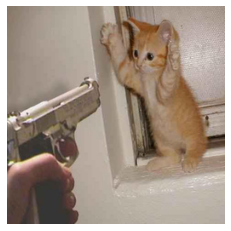

In [39]:
class_id = 'hamster'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][7]
selected_images.append(images[img])
show_images_by_idx(img)

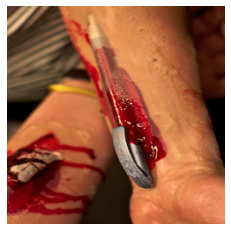

In [40]:
class_id = 'ballpoint'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

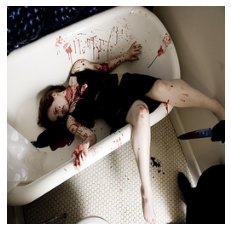

In [41]:
class_id = 'tub'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][5]
show_images_by_idx(img)

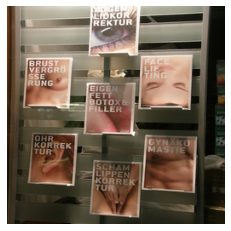

In [42]:
class_id = 'bookshop'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][2]
show_images_by_idx(img)

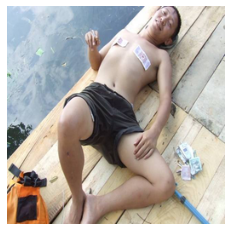

In [43]:
class_id = 'bikini'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][8]
show_images_by_idx(img)

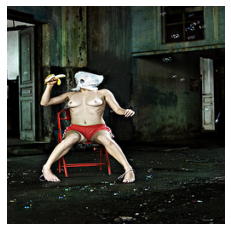

In [44]:
class_id = 'plastic bag'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][10]
selected_images.append(images[img])
show_images_by_idx(img)

## validation set

In [45]:
#csv_tag = 'imagenet21k_small_classes'
#csv_tag = 'imagenet21k_train'
#csv_tag = 'imagenet21k_val'
#csv_tag = 'imagenet_train'
csv_tag = 'imagenet_val'

data_type = 'moral'

# 1.50 - 3.50 Vit-B-16
dir_path_csv = f'/workspace/datasets/results/normativity/clip_stuff/results/{csv_tag}/{data_type}/Clip_ViT-B/sim_prompt_tuned1627564750.4050713/toxic_images.csv'
prompt_path = f'/workspace/datasets/results/normativity/clip_stuff/results/SMID/{data_type}/Clip_ViT-B-16/prompt_tuning_clip/cv_10_new_multiTestset0dot1/1.00_1.50_3.50/1627564750.4050713/4/prompts.p'

files = readoffendingimages_csv(dir_path_csv,t=.8)
print(len(files))

1671


In [46]:
if csv_tag == 'imagenet_train':
    images = [imagenet_path_dict_train[file_] for file_ in files]
    print('#Images found offending', len(images))
elif 'imagenet21k' in csv_tag:
    images = [imagenet_path_dict_21kval[file_] for file_ in files]
    print('#Images found offending', len(images))
else:
    images = [imagenet_path_dict[file_] for file_ in files]
    print('#Images found offending', len(images))

#Images found offending 1671


In [47]:
import matplotlib.pyplot as plt
import PIL
from tqdm import tqdm
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import ImageFilter
import os

selected_images_indices = list(range(len(images)))

found_images_by_wordnet_id = dict()
for im_idx in selected_images_indices:
    imgnet_dirname = os.path.basename(os.path.dirname(images[im_idx]))
    if imgnet_dirname in list(found_images_by_wordnet_id.keys()):
        found_images_by_wordnet_id[imgnet_dirname]['value'] += 1
        found_images_by_wordnet_id[imgnet_dirname]['idx'].append(im_idx)
    else:
        found_images_by_wordnet_id[imgnet_dirname] = {'value': 1, 'idx': list([im_idx])}

In [48]:
found_images_by_wordnet_id_classnames = dict()
for imageclass_id in list(found_images_by_wordnet_id.keys()):
    #print(imagenet_dir_class[imageclass_id], found_images_by_wordnet_id[imageclass_id])
    found_images_by_wordnet_id_classnames[imagenet_dir_class[imageclass_id]] = {'value': None, 'idx': None}
    found_images_by_wordnet_id_classnames[imagenet_dir_class[imageclass_id]]['value'] = found_images_by_wordnet_id[imageclass_id]['value']
    found_images_by_wordnet_id_classnames[imagenet_dir_class[imageclass_id]]['idx'] = found_images_by_wordnet_id[imageclass_id]['idx']

In [49]:
print(found_images_by_wordnet_id_classnames['tub'])

{'value': 5, 'idx': [116, 550, 1038, 1318, 1319]}


1671
total classes with possible polluted images: 450
hammerhead
barber chair
stove
wolf spider
mask
padlock
wok
crib
milk can
shower cap
revolver
loupe
lighter
torch
rock crab
plane
syringe
mousetrap
ice lolly
spatula
screwdriver
rifle
hognose snake
muzzle
parking meter
switch
American alligator
washer
hotdog
pencil sharpener
matchstick
beer bottle
wild boar
espresso maker
oxygen mask
thimble
comic book
chain
scorpion
pitcher
cockroach
black widow
mink
soap dispenser
guillotine
sunscreen
butternut squash
dishwasher
waffle iron
hammer
bagel
gasmask
sturgeon
packet
lumbermill
tub
plastic bag
punching bag
great white shark
suspension bridge
eel
shower curtain
cannon
butcher shop
barrel
platypus
hatchet
wig
tobacco shop
book jacket
neck brace
projectile
turnstile
banana
cowboy boot
folding chair
laptop
microwave
shopping cart
skunk
power drill
frying pan
coho
bathtub
horned viper
hen
red fox
ski mask
cock
swing
umbrella
radiator
shovel
street sign
oil filter
ice bear
dial telephone
chain 

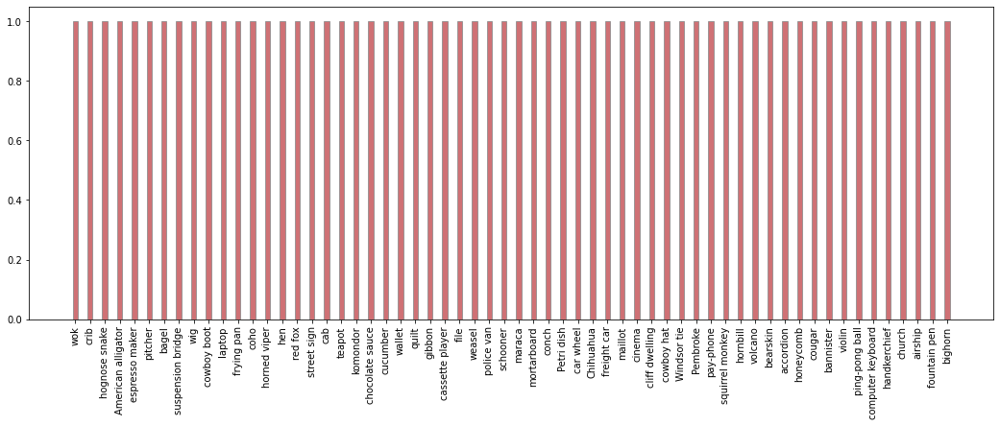

In [50]:
import seaborn as sns
print(len(images))
print('total classes with possible polluted images:',len(list(found_images_by_wordnet_id.keys())))
found_images_by_wordnet_id_list = list()
for imageclass_id in list(found_images_by_wordnet_id.keys()):
    #print(imagenet_dir_class[imageclass_id], found_images_by_wordnet_id[imageclass_id])
    print(imagenet_dir_class[imageclass_id])
    found_images_by_wordnet_id_list.append((imagenet_dir_class[imageclass_id], found_images_by_wordnet_id[imageclass_id]))
found_images_by_wordnet_id_list.sort(key=lambda tup: tup[1]['value'])

plt_list = found_images_by_wordnet_id_list[:60]
print(plt_list)
bars = [e[0] for e in plt_list]
y_pos = [e[1]['value'] for e in plt_list]
plt.figure(figsize=(18,6))
bar_color = sns.color_palette('deep')[3]
bar_color_edge = sns.color_palette('deep')[-3]
plt.bar(bars, 
        y_pos, width=0.35,
        alpha=0.8, color=bar_color, edgecolor=bar_color_edge, linewidth=1.)
ticks = np.arange(len(plt_list), dtype=float)
ticks -= 0.5
plt.xticks(rotation=90)
plt.show()
plt.close()

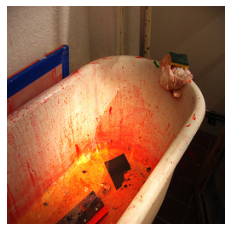

In [51]:
class_id = 'tub'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)

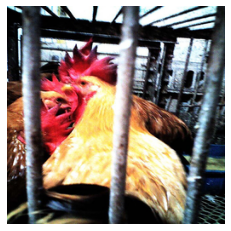

In [52]:
class_id = 'cock'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][1]
show_images_by_idx(img)

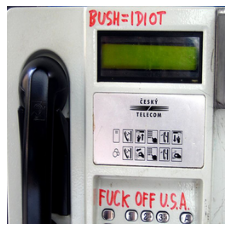

In [53]:
class_id = 'pay-phone'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

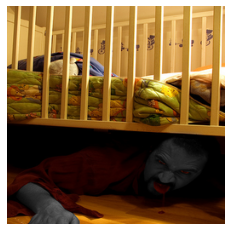

In [54]:
class_id = 'crib'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
selected_images.append(images[img])
show_images_by_idx(img)

In [55]:
class_id = 'muzzle'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][2]
selected_images.append(images[img])
img = found_images_by_wordnet_id_classnames[class_id]['idx'][7]
#selected_images.append(images[img])

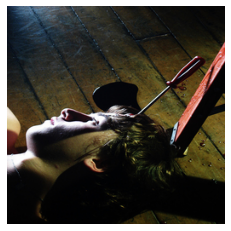

In [56]:
class_id = 'screwdriver'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)
selected_images.append(images[img])

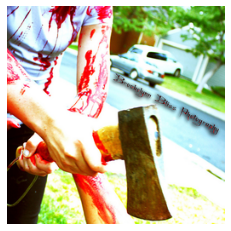

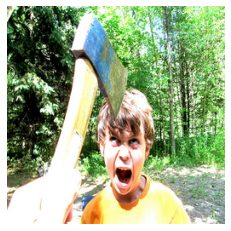

In [57]:
class_id = 'hatchet'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)
selected_images.append(images[img])
img = found_images_by_wordnet_id_classnames[class_id]['idx'][2]
show_images_by_idx(img)
selected_images.append(images[img])

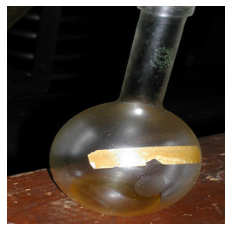

In [58]:
class_id = 'beaker'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][1]
show_images_by_idx(img)

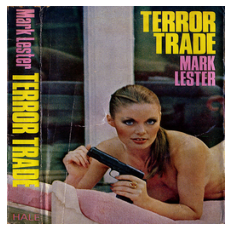

In [59]:
class_id = 'book jacket'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][5]
show_images_by_idx(img)

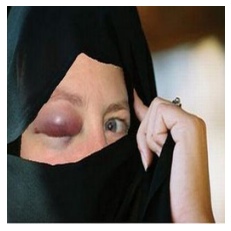

In [60]:
class_id = 'abaya'
img = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
show_images_by_idx(img)
selected_images.append(images[img])

In [61]:
def uniform_blur(sharp_image, uniform_filter_size):
    # The multidimensional filter is required to avoid gray scale images
    multidim_filter_size = (uniform_filter_size, uniform_filter_size, 1)
    blurred_image = scipy.ndimage.filters.uniform_filter(sharp_image, size=multidim_filter_size)
    return blurred_image

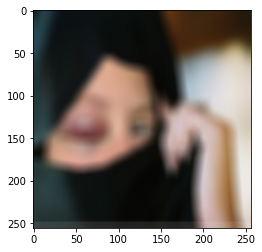

In [62]:
class_id = 'abaya'
im_str = found_images_by_wordnet_id_classnames[class_id]['idx'][0]
img = PIL.Image.open(images[im_str])
img = img.convert("RGB")
img = img.resize((256,256), PIL.Image.ANTIALIAS)
img_ = uniform_blur(img, 15)
plt.imshow(img_)
plt.show()

In [63]:
import matplotlib.pyplot as plt
import PIL
from tqdm import tqdm
from mpl_toolkits.axes_grid1 import ImageGrid
from PIL import ImageFilter
import os


fig = plt.figure(figsize=(16,8), dpi=1200)
rows, cols = 3, 8
    
start_idx = 0#1500
selected_images_idx = list(range(start_idx,len(selected_images)))

grid = ImageGrid(fig, 111,  # similar to subplot(111)
                 nrows_ncols=(rows, cols),  # creates 2x2 grid of axes
                 axes_pad=0.1,  # pad between axes in inch.
                 )

#for ax, im in tqdm(zip(grid, images[:rows*cols])):
for i, ax, im_str in tqdm(zip(list(range(rows*cols)), grid, selected_images)):
    print(im_str)
    t = plt.text(0.5, 0.5, 'text', transform=ax.transAxes, fontsize=30)
    t.set_bbox(dict(facecolor='red', alpha=0.5, edgecolor='red'))
    imgnet_dirname = os.path.basename(os.path.dirname(im_str))
    img = PIL.Image.open(im_str)
    #img = PIL.Image.open(im)
    img = img.convert("RGB")
    img = img.resize((256,256), PIL.Image.ANTIALIAS)
    # enable blur
    img = uniform_blur(img, 20)
    ax.imshow(np.asarray(img))
    text_size=12#20
    #2,8
    text_ = imagenet_dir_class[imgnet_dirname][:16]
    if text_ == 'miniature pinsch':
        text_ = 'miniature pin.'
    t = ax.text(10., 243., text_, size=text_size, ha="left", va='bottom', color="w")
    #4,4
    #t = ax.text(5., 250., imagenet_dir_class[imgnet_dirname], size=text_size, ha="left", va='bottom', color="w")
    #t = plt.text(0.5, 0.5, 'text', transform=ax.transAxes, fontsize=30)
    t.set_bbox(dict(facecolor='black', alpha=0.3, edgecolor='black'))
for ax in grid:
    ax.axis('off')


#plt.savefig(os.path.join('/workspace/datasets/results/', f'offending_images_16.png'))
plt.show()

11it [00:00, 105.18it/s]

/workspace/datasets/imagenet1k/train/n02056570/n02056570_551.JPEG
/workspace/datasets/imagenet1k/train/n02504458/n02504458_5308.JPEG
/workspace/datasets/imagenet1k/train/n04493381/n04493381_48482.JPEG
/workspace/datasets/imagenet1k/train/n03709823/n03709823_9773.JPEG
/workspace/datasets/imagenet1k/train/n03763968/n03763968_13233.JPEG
/workspace/datasets/imagenet1k/train/n03249569/n03249569_22166.JPEG
/workspace/datasets/imagenet1k/train/n02107312/n02107312_917.JPEG
/workspace/datasets/imagenet1k/train/n02480855/n02480855_12595.JPEG
/workspace/datasets/imagenet1k/train/n03337140/n03337140_466.JPEG
/workspace/datasets/imagenet1k/train/n03028079/n03028079_12090.JPEG
/workspace/datasets/imagenet1k/train/n04493381/n04493381_76994.JPEG
/workspace/datasets/imagenet1k/train/n04493381/n04493381_74049.JPEG
/workspace/datasets/imagenet1k/train/n07742313/n07742313_5256.JPEG
/workspace/datasets/imagenet1k/train/n02422699/n02422699_10276.JPEG
/workspace/datasets/imagenet1k/train/n02342885/n02342885_

24it [00:00, 101.98it/s]


/workspace/datasets/imagenet1k/val/n03498962/ILSVRC2012_val_00032228.JPEG
/workspace/datasets/imagenet1k/val/n03498962/ILSVRC2012_val_00027332.JPEG
/workspace/datasets/imagenet1k/val/n02667093/ILSVRC2012_val_00048389.JPEG
